In [44]:
import os

import numpy as np
import pandas as pd
import seaborn as sns
import missingno as msno
import matplotlib.pyplot as plt

In [2]:
PATH_DATA = os.path.join("..", "data", "raw", "raw_data_finance.csv")

In [3]:
stocks_df = pd.read_csv(PATH_DATA, sep=";", index_col="date")
stocks_df.drop(columns="Unnamed: 0", inplace=True)

/var/folders/4q/3_bfyqnn7yv5jcjq98x2jf680000gn/T/ipykernel_63780/1091532381.py:1: DtypeWarning: Columns (6,8,16,17,26,33,34,66,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,252,253,255,257,259,261,263,265,267,269,270,271,272,273,274,275,276,277,278,279,280,284,285,286,290) have mixed types. Specify dtype option on import or set low_memory=False.
  stocks_df = pd.read_csv(PATH_DATA, sep=";", index_col="date")


In [4]:
print(f"Num records: {len(stocks_df)}")

Num records: 210224


In [5]:
print(f"Num columns: {len(stocks_df.columns)}")

Num columns: 289


In [6]:
print(f"Num stocks: {stocks_df.symbol.nunique()}")

Num stocks: 1407


In [7]:
num_duplicates = sum(stocks_df.duplicated())
print(f"Num duplicated rows: {num_duplicates}")
print(f"Percentage of duplicates: {num_duplicates / len(stocks_df): .2f}")

Num duplicated rows: 52208
Percentage of duplicates:  0.25


Drop duplicates

In [8]:
stocks_df.drop_duplicates(inplace=True)
print(f"Num records after dropping duplicates: {len(stocks_df)}")

Num records after dropping duplicates: 158016


In [9]:
print(f"Num of stocks: {stocks_df.symbol.nunique()}")

Num of stocks: 1407


In [10]:
print(f"Start date: {stocks_df.index.min()}")
print(f"End date: {stocks_df.index.max()}")

Start date: 1995-01-31
End date: 2022-09-30


Analyse NaNs

In [11]:
stocks_df.replace('missing', np.NAN, inplace=True)

In [12]:
dates = stocks_df.index.unique().tolist() 
print(f"Dates:")
print(dates)

Dates:
['1995-01-31', '1995-03-31', '1995-06-30', '1995-09-30', '1996-01-31', '1996-03-31', '1996-06-30', '1996-09-30', '1997-01-31', '1997-03-31', '1997-06-30', '1997-09-30', '1998-01-31', '1998-03-31', '1998-06-30', '1998-09-30', '1999-01-31', '1999-03-31', '1999-06-30', '1999-09-30', '2000-01-31', '2000-03-31', '2000-06-30', '2000-09-30', '2001-01-31', '2001-03-31', '2001-06-30', '2001-09-30', '2002-01-31', '2002-03-31', '2002-06-30', '2002-09-30', '2003-01-31', '2003-03-31', '2003-06-30', '2003-09-30', '2004-01-31', '2004-03-31', '2004-06-30', '2004-09-30', '2005-01-31', '2005-03-31', '2005-06-30', '2005-09-30', '2006-01-31', '2006-03-31', '2006-06-30', '2006-09-30', '2007-01-31', '2007-03-31', '2007-06-30', '2007-09-30', '2008-01-31', '2008-03-31', '2008-06-30', '2008-09-30', '2009-01-31', '2009-03-31', '2009-06-30', '2009-09-30', '2010-01-31', '2010-03-31', '2010-06-30', '2010-09-30', '2011-01-31', '2011-03-31', '2011-06-30', '2011-09-30', '2012-01-31', '2012-03-31', '2012-06-30'

In [13]:
for date in dates:
    date_total_records = len(stocks_df[stocks_df.index == date])
    date_close_null_records = stocks_df[stocks_df.index == date].close.isna().sum()
    
    print(f"Date {date}, "
          f"total records: {date_total_records},"
          f" close null records: {date_close_null_records}")

Date 1995-01-31, total records: 1407, close null records: 1407
Date 1995-03-31, total records: 1407, close null records: 1407
Date 1995-06-30, total records: 1407, close null records: 1407
Date 1995-09-30, total records: 1407, close null records: 1407
Date 1996-01-31, total records: 1407, close null records: 1407
Date 1996-03-31, total records: 1407, close null records: 1407
Date 1996-06-30, total records: 1407, close null records: 1407
Date 1996-09-30, total records: 1407, close null records: 1407
Date 1997-01-31, total records: 1407, close null records: 1407
Date 1997-03-31, total records: 1407, close null records: 1407
Date 1997-06-30, total records: 1407, close null records: 1407
Date 1997-09-30, total records: 1407, close null records: 1407
Date 1998-01-31, total records: 1407, close null records: 1407
Date 1998-03-31, total records: 1407, close null records: 1407
Date 1998-06-30, total records: 1407, close null records: 1407
Date 1998-09-30, total records: 1407, close null record

<Axes: >

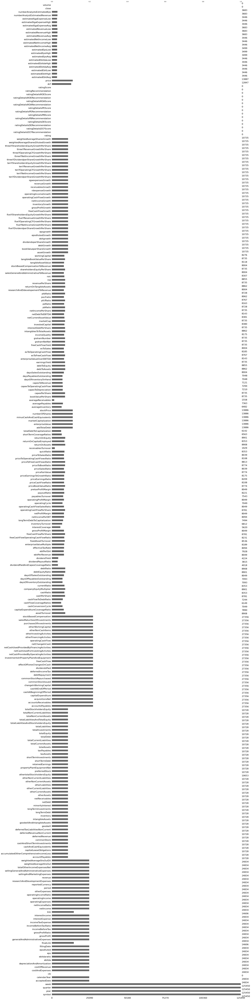

In [14]:
msno.bar(stocks_df[stocks_df.index <= '2017-01-31'])

<Axes: >

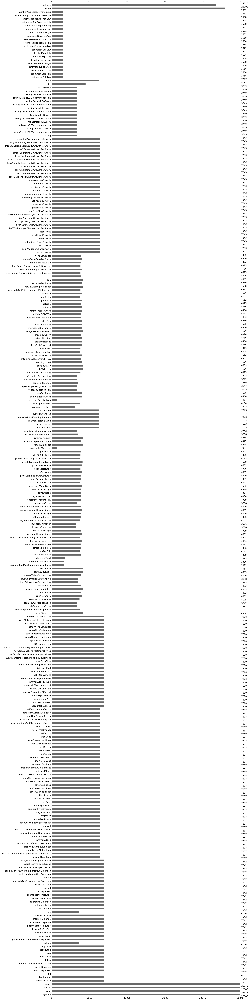

In [15]:
msno.bar(stocks_df[('2017-01-31' < stocks_df.index) & (stocks_df.index <= '2022-01-31') ])

Since we use 'close' feature as a basis for the target value, we drop records with dates, where no 'close' values were recorded.

In [16]:
stocks_df = stocks_df[stocks_df.index > '2017-01-31']
print(f"Num records: {len(stocks_df)}")

Num records: 32566


Analyse columns

In [40]:
for column in stocks_df.columns:
    try:
        stocks_df[column] = stocks_df[column].astype("float")
    except Exception as e:
        pass

In [41]:
stocks_df.dtypes

symbol                            object
year                             float64
quarter                          float64
week                             float64
acceptedDate                      object
                                  ...   
estimatedSgaExpenseLow           float64
numberAnalystEstimatedRevenue    float64
numberAnalystsEstimatedEps       float64
close                            float64
volume                           float64
Length: 289, dtype: object

Check correlated collumns

<Axes: >

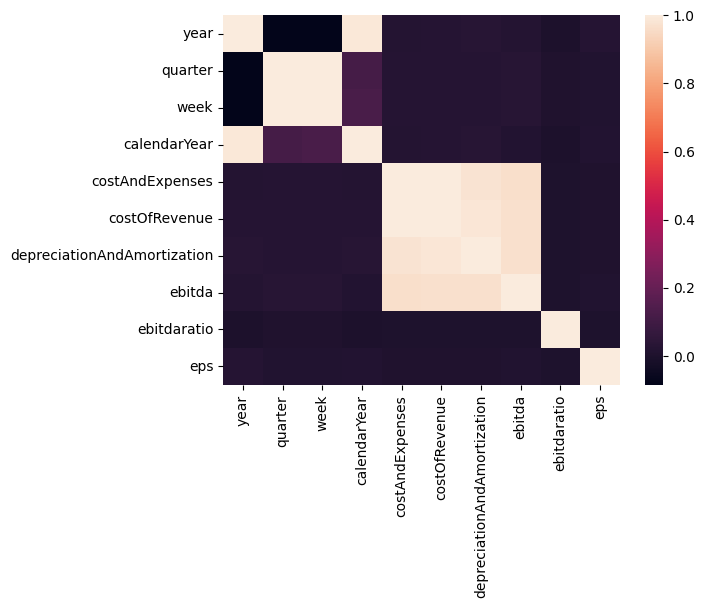

In [62]:
sns.heatmap(stocks_df.select_dtypes("float").drop(columns="cik").iloc[:, :10].corr(), annot=False)

Maybe we should drop a lot of correlated features?

In [63]:
to_drop = [
    "cik",  # All values are NaN.
    "link",  # Not a feature.
    "finalLink"  # Not a feature.
]

In [64]:
stocks_df = stocks_df.drop(columns=to_drop)

In [157]:
total_marketCap = stocks_df.groupby("symbol").marketCap.sum()

In [167]:
good_symbols = total_marketCap[total_marketCap > 0].index.tolist()
bad_symbols = total_marketCap[total_marketCap == 0].index.tolist()

<Axes: >

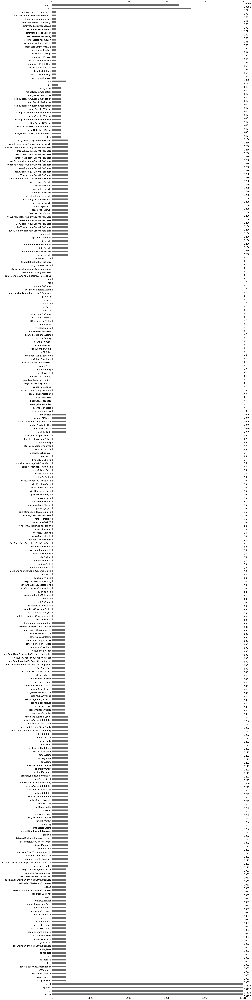

In [168]:
msno.bar(stocks_df[stocks_df.symbol.isin(bad_symbols)])

<Axes: >

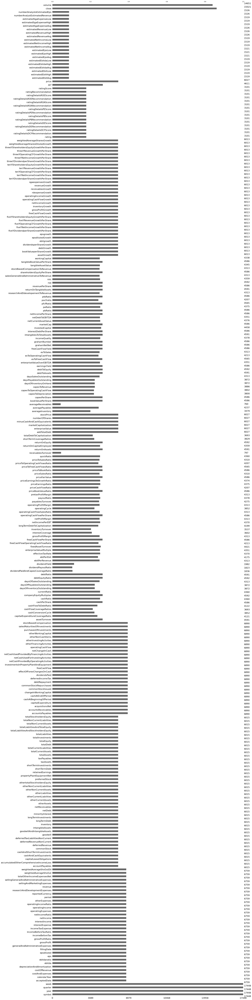

In [166]:
msno.bar(stocks_df[stocks_df.symbol.isin(good_symbols)])

In [169]:
stocks_df_filtered = stocks_df[stocks_df.symbol.isin(good_symbols)]

<Axes: >

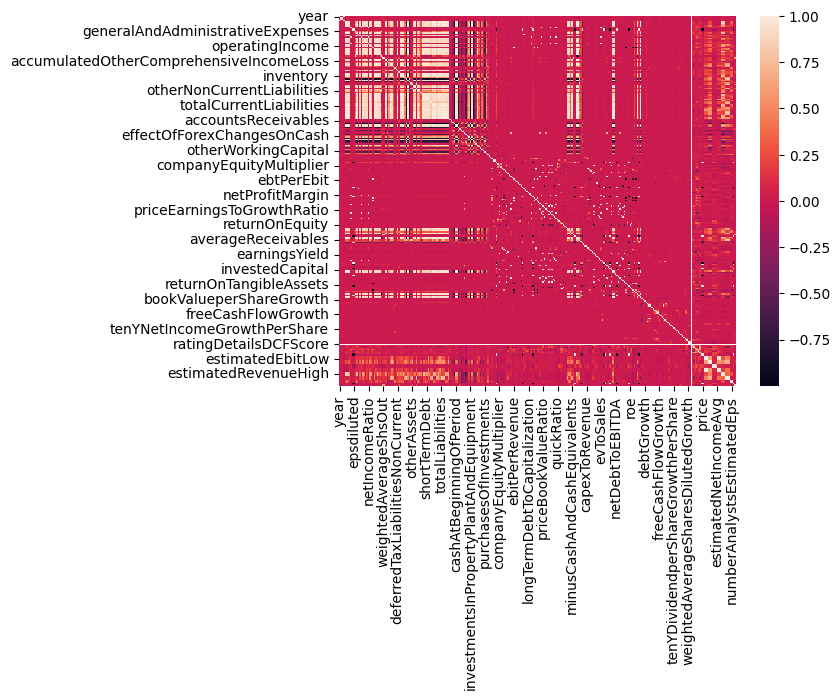

In [175]:
corr_matrix = stocks_df_filtered.select_dtypes("float").corr() 
sns.heatmap(corr_matrix)

In [176]:
# Select upper triangle of correlation matrix
upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))

# Find features with correlation greater than 0.95
to_drop = [column for column in upper.columns if any(upper[column] > 0.95)]

In [179]:
print(f"Number of highly correlated features: {len(to_drop)}")

Number of highly correlated features: 132


Since we have a lot of correlated features, we can perform PCA to reduce the dimensionality.

<Axes: xlabel='date', ylabel='estimatedEbitAvg'>

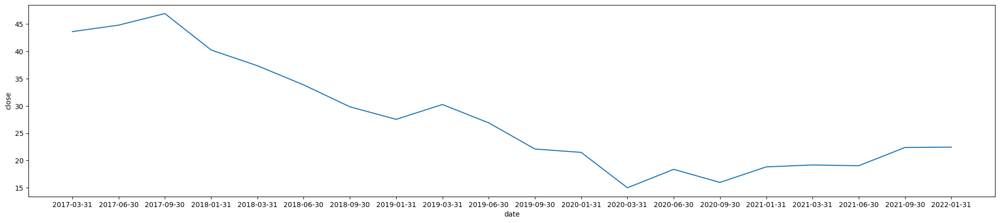

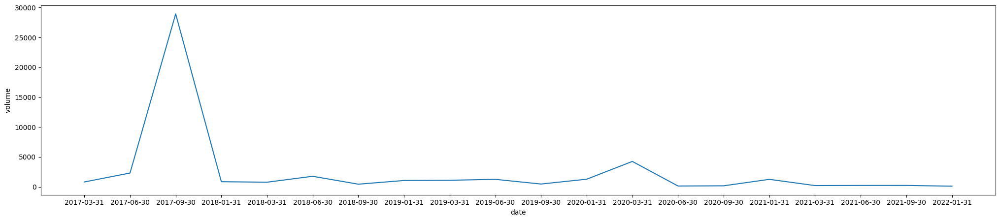

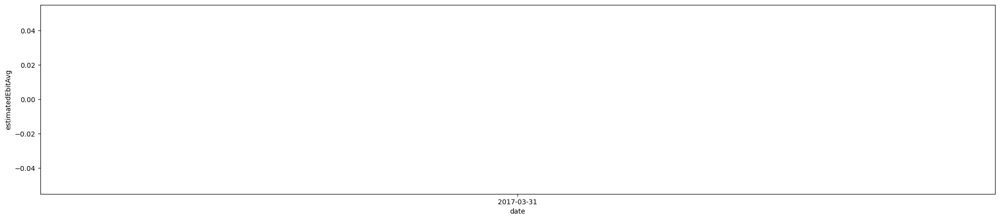

In [196]:
plt.figure(figsize=(25, 5))
sns.lineplot(stocks_df_filtered[stocks_df_filtered.symbol == 'ALMIL.PA'].close)

plt.figure(figsize=(25, 5))
sns.lineplot(stocks_df_filtered[stocks_df_filtered.symbol == 'ALMIL.PA'].volume)

plt.figure(figsize=(25, 5))
sns.lineplot(stocks_df_filtered[stocks_df_filtered.symbol == 'ALMIL.PA'].estimatedEbitAvg)

In [197]:
stocks_df_filtered[stocks_df_filtered.symbol == 'ALMIL.PA'].estimatedEbitAvg

date
2017-03-31   NaN
2017-06-30   NaN
2017-09-30   NaN
2018-01-31   NaN
2018-03-31   NaN
2018-06-30   NaN
2018-09-30   NaN
2019-01-31   NaN
2019-03-31   NaN
2019-06-30   NaN
2019-09-30   NaN
2020-01-31   NaN
2020-03-31   NaN
2020-06-30   NaN
2020-09-30   NaN
2021-01-31   NaN
2021-03-31   NaN
2021-06-30   NaN
2021-09-30   NaN
2022-01-31   NaN
2022-03-31   NaN
2022-06-30   NaN
2022-09-30   NaN
Name: estimatedEbitAvg, dtype: float64

In [198]:
good_symbols

['217A.F',
 '22UA.F',
 '3CP.F',
 '3E2.F',
 '558.SI',
 '8GW.IR',
 'A17U.SI',
 'A3M.MC',
 'A7RU.SI',
 'AALB.AS',
 'AALR3.SA',
 'ABCA.PA',
 'ABCB4.SA',
 'ABEO.PA',
 'ABEV3.SA',
 'ABI.BR',
 'ABIO.PA',
 'ABN.AS',
 'ABNX.PA',
 'ABO.BR',
 'ABVX.PA',
 'AC.PA',
 'ACA.PA',
 'ACCB.BR',
 'ACCEL.AS',
 'ACKB.BR',
 'ACOMO.AS',
 'ACS.MC',
 'ACX.MC',
 'AD.AS',
 'ADOC.PA',
 'ADP.PA',
 'AED.BR',
 'AEDAS.MC',
 'AENA.MC',
 'AF.PA',
 'AGFB.BR',
 'AGN.AS',
 'AGRO3.SA',
 'AGS.BR',
 'AIY.SI',
 'AJAX.AS',
 'AJBU.SI',
 'AKA.PA',
 'AKE.PA',
 'AKOM.PA',
 'AKW.PA',
 'AKZA.AS',
 'ALACT.PA',
 'ALADA.PA',
 'ALAGR.PA',
 'ALALO.PA',
 'ALAMG.PA',
 'ALBFR.PA',
 'ALBI.PA',
 'ALBLD.PA',
 'ALBLU.PA',
 'ALCAR.PA',
 'ALCES.PA',
 'ALCG.PA',
 'ALCJ.PA',
 'ALCLA.PA',
 'ALCLS.PA',
 'ALCOF.PA',
 'ALCOI.PA',
 'ALCOR.PA',
 'ALCRB.PA',
 'ALCYB.PA',
 'ALDAR.PA',
 'ALDBL.PA',
 'ALDBT.PA',
 'ALDEI.PA',
 'ALDEL.PA',
 'ALDLS.PA',
 'ALDNX.PA',
 'ALDR.PA',
 'ALDRV.PA',
 'ALDUB.PA',
 'ALDV.PA',
 'ALECR.PA',
 'ALEMV.PA',
 'ALENE.PA',
 'ALENT.P

<Axes: >

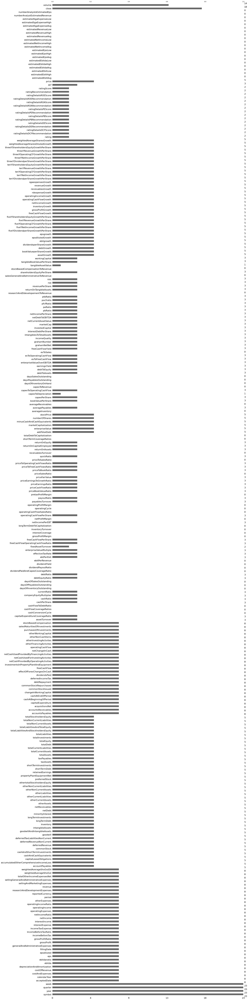

In [204]:
msno.bar(stocks_df[stocks_df.symbol == good_symbols[5]])

In [206]:
from tqdm import tqdm

In [216]:
columns = stocks_df_filtered.columns
bad_features = list()
for symbol in tqdm(stocks_df_filtered.symbol.unique()):
    bad_features.extend(columns[stocks_df_filtered[stocks_df_filtered.symbol == symbol].isna().all().values])

100%|██████████| 751/751 [00:13<00:00, 57.56it/s]


In [218]:
len(set(bad_features))

239

In [224]:
good_features = list(set(columns).difference(set(bad_features)))

<Axes: >

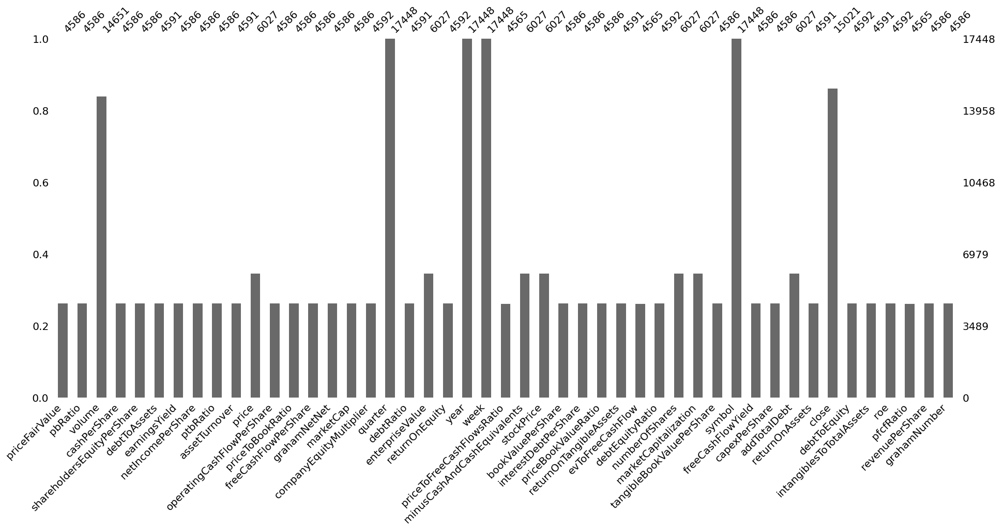

In [227]:
msno.bar(stocks_df_filtered[good_features])

<Axes: >

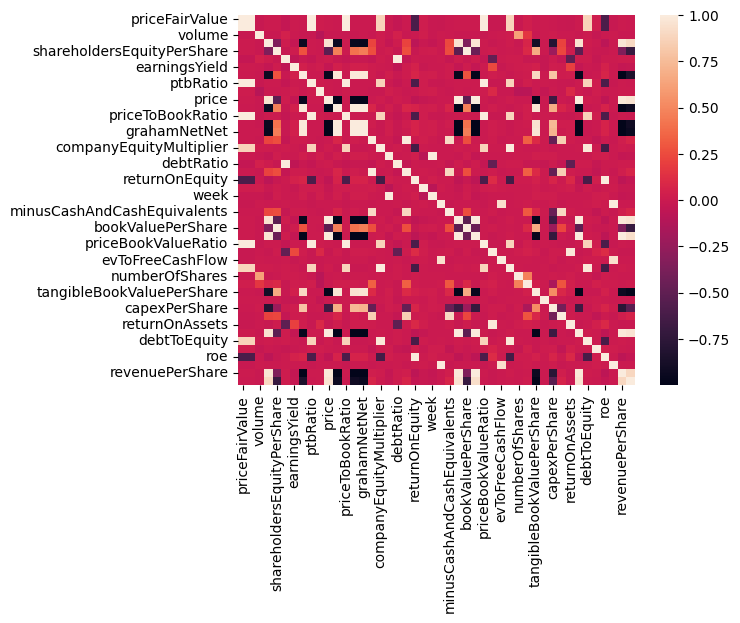

In [230]:
sns.heatmap(stocks_df_filtered[good_features].select_dtypes("float").corr())

Interpolating the rest of the features

In [237]:
stocks_df_filtered = stocks_df_filtered[good_features]

<Axes: xlabel='date', ylabel='priceFairValue'>

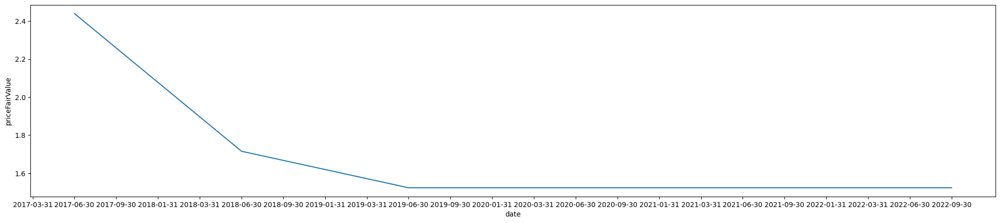

In [235]:
plt.figure(figsize=(25, 5))
sns.lineplot(stocks_df_filtered[stocks_df_filtered.symbol == 'ALMIL.PA'].priceFairValue.interpolate())

In [246]:
tmp = stocks_df_filtered.groupby("symbol").apply(lambda group: group.interpolate().ffill().bfill())

/var/folders/4q/3_bfyqnn7yv5jcjq98x2jf680000gn/T/ipykernel_63780/4143007751.py:1: FutureWarning: DataFrame.interpolate with object dtype is deprecated and will raise in a future version. Call obj.infer_objects(copy=False) before interpolating instead.
  tmp = stocks_df_filtered.groupby("symbol").apply(lambda group: group.interpolate().ffill().bfill())
/var/folders/4q/3_bfyqnn7yv5jcjq98x2jf680000gn/T/ipykernel_63780/4143007751.py:1: FutureWarning: DataFrame.interpolate with object dtype is deprecated and will raise in a future version. Call obj.infer_objects(copy=False) before interpolating instead.
  tmp = stocks_df_filtered.groupby("symbol").apply(lambda group: group.interpolate().ffill().bfill())
/var/folders/4q/3_bfyqnn7yv5jcjq98x2jf680000gn/T/ipykernel_63780/4143007751.py:1: FutureWarning: DataFrame.interpolate with object dtype is deprecated and will raise in a future version. Call obj.infer_objects(copy=False) before interpolating instead.
  tmp = stocks_df_filtered.groupby("symb

<Axes: >

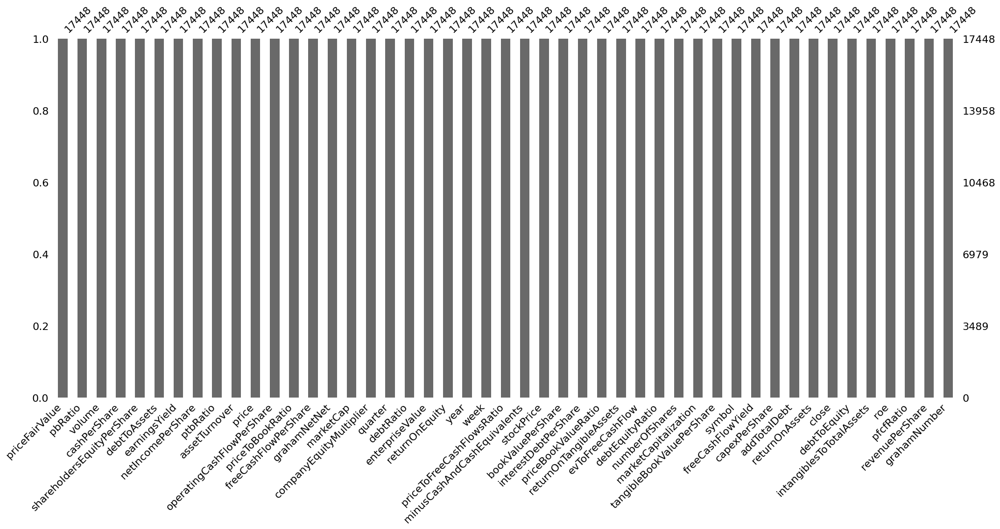

In [248]:
msno.bar(tmp)